In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import plotly.express as px

from sklearn.preprocessing import StandardScaler

from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.model_selection import cross_val_score

from sklearn.linear_model import LogisticRegression
from sklearn import svm
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier


from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import classification_report

from sklearn.model_selection import GridSearchCV


https://www.researchgate.net/publication/224117546_Short-term_memory_mechanisms_in_neural_network_learning_of_robot_navigation_tasks_A_case_study

# Story

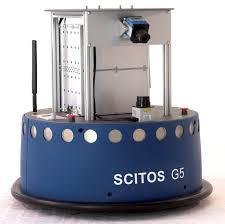

- A months ago, I programmed SCITOS, a robot, to follow the wall without any collision
- Unfortunately, last week my computer crashed, and I'd lost the program...
- The program is still in my SCITOS but it's impossible to extract the program
- The only things SCITOS can do is to execute the program and collect all the data of his 24 Ultrasound sensors and the action he did
- My mission is to recreate the programm from the data SCITOS gave to me with some Machine learning model

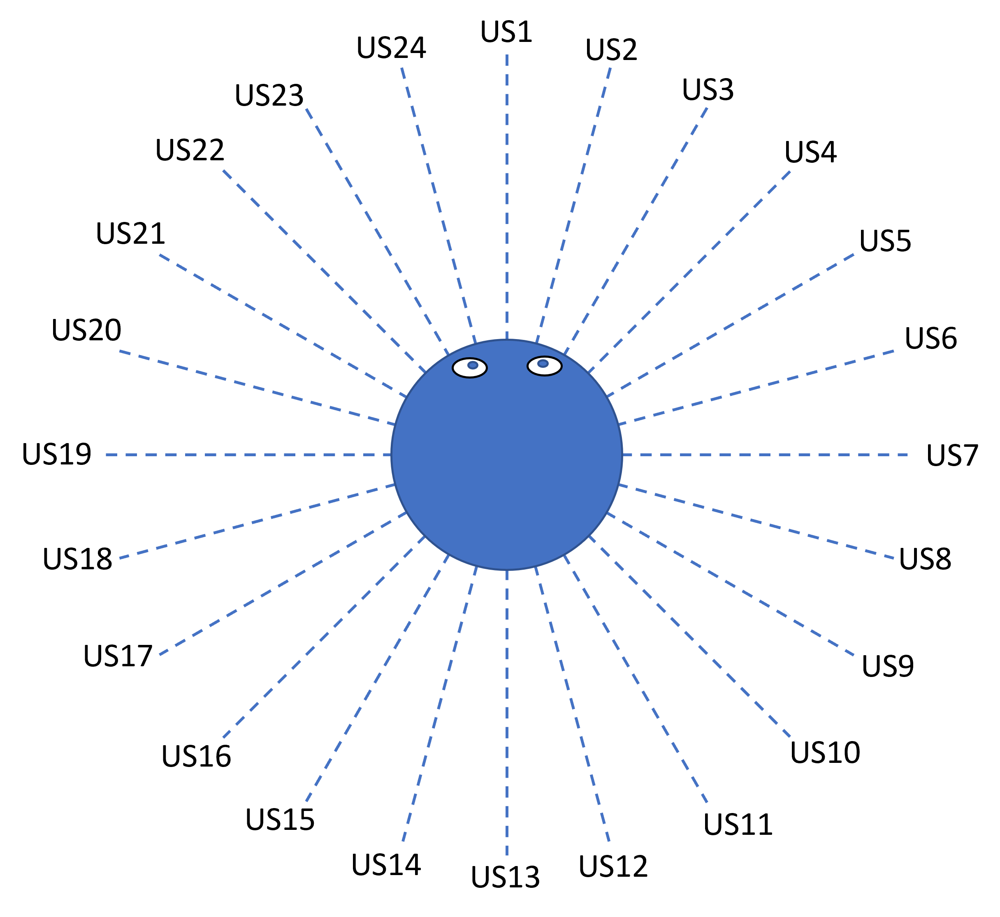

# Exploratory Data Analysis

## Data

SCITOS executed his program and navigated through the room following the wall in a clockwise direction for 4
rounds. He's obtained this data :

In [2]:
path='sensor_readings_24.csv'
names_columns=['US1','US2','US3','US4','US5','US6','US7','US8','US9','US10','US11','US12','US13','US14','US15','US16','US17','US18','US19','US20','US21','US22','US23','US24','Class']
data_sensor=pd.read_csv(path,header=None,names=names_columns)
data_sensor.head()

,US1,US2,US3,US4,US5,US6,US7,US8,US9,US10,...,US16,US17,US18,US19,US20,US21,US22,US23,US24,Class
0,0.438,0.498,3.625,3.645,5.0,2.918,5.0,2.351,2.332,2.643,...,0.593,0.502,0.493,0.504,0.445,0.431,0.444,0.440,0.429,Slight-Right-Turn
1,0.438,0.498,3.625,3.648,5.0,2.918,5.0,2.637,2.332,2.649,...,0.592,0.502,0.493,0.504,0.449,0.431,0.444,0.443,0.429,Slight-Right-Turn
2,0.438,0.498,3.625,3.629,5.0,2.918,5.0,2.637,2.334,2.643,...,0.593,0.502,0.493,0.504,0.449,0.431,0.444,0.446,0.429,Slight-Right-Turn
3,0.437,0.501,3.625,3.626,5.0,2.918,5.0,2.353,2.334,2.642,...,0.593,0.502,0.493,0.504,0.449,0.431,0.444,0.444,0.429,Slight-Right-Turn
4,0.438,0.498,3.626,3.629,5.0,2.918,5.0,2.640,2.334,2.639,...,0.592,0.502,0.493,0.504,0.449,0.431,0.444,0.441,0.429,Slight-Right-Turn


24 first columns : raw data from the 24 ultrasound sensors.
These values are between 0 and 5.

In my experience in robotics, I would say this represent the voltage of the signal from the sensor (range 20cm to 300cm)
Hypothesis : 0.5V --> 20cm and 5V --> >300cm (the data will keep raw for this analyze)

4 possible actions  :

- Move-Forward
- Sharp-Right-Turn
- Slight-Right-Turn
- Slight-Left-Turn

## Shape

In [3]:
data_sensor.shape

(5456, 25)

5456 instances of 25 columns each

## Atypical values ?

In [4]:
data_sensor.describe().iloc[:,:12]

,US1,US2,US3,US4,US5,US6,US7,US8,US9,US10,US11,US12
count,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000
mean,1.471617,2.327043,2.489347,2.796501,2.958552,2.893073,3.351113,2.540397,3.125621,2.832386,2.549398,2.077776
std,0.802801,1.410146,1.247435,1.309368,1.339225,1.282575,1.413692,1.111554,1.356965,1.307843,1.382029,1.249301
min,0.400000,0.437000,0.470000,0.833000,1.120000,1.114000,1.122000,0.859000,0.836000,0.810000,0.783000,0.778000
25%,0.921000,1.362000,1.538750,1.731000,1.774000,1.785750,1.930750,1.618000,1.799750,1.636000,1.579000,1.293000
50%,1.335000,1.904500,2.064000,2.458000,2.667000,2.682500,3.225500,2.172000,2.802000,2.679000,1.999500,1.689000
75%,1.814000,2.681500,2.739250,4.093500,4.314500,3.835250,5.000000,3.193000,5.000000,3.526250,3.216250,2.281500
max,5.000000,5.025000,5.029000,5.017000,5.000000,5.005000,5.008000,5.087000,5.000000,5.022000,5.019000,5.000000


In [5]:
data_sensor.describe().iloc[:,12:]

,US13,US14,US15,US16,US17,US18,US19,US20,US21,US22,US23,US24
count,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000,5456.00000,5456.000000,5456.000000,5456.000000,5456.000000,5456.000000
mean,2.125777,2.190486,2.205772,1.202111,0.989831,0.910273,1.05811,1.076320,1.015923,1.778034,1.555045,1.578508
std,1.407168,1.576873,1.715435,1.098568,0.942075,0.889527,1.14463,1.141498,0.887439,1.571686,1.291447,1.150480
min,0.770000,0.756000,0.495000,0.424000,0.373000,0.354000,0.34000,0.355000,0.380000,0.370000,0.367000,0.377000
25%,1.190750,1.031000,0.860000,0.690000,0.581000,0.529750,0.52300,0.541750,0.567000,0.743000,0.792000,0.884000
50%,1.609000,1.493000,1.328500,0.803000,0.738000,0.685000,0.69100,0.693000,0.764000,1.030500,1.071000,1.289000
75%,2.357750,2.739250,4.436250,1.159000,0.913000,0.837000,0.85700,0.863000,1.002250,2.068250,1.559500,1.657250
max,5.003000,5.000000,5.000000,5.000000,5.000000,5.000000,5.00000,5.000000,5.000000,5.000000,5.000000,5.000000


No atypical values such as negatif values or over 5

## Availability

In [6]:
data_sensor.isnull().sum().sum()

0

No missing values. It's a pretty clean dataset

## Data types

In [7]:
data_sensor.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5456 entries, 0 to 5455
Data columns (total 25 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   US1     5456 non-null   float64
 1   US2     5456 non-null   float64
 2   US3     5456 non-null   float64
 3   US4     5456 non-null   float64
 4   US5     5456 non-null   float64
 5   US6     5456 non-null   float64
 6   US7     5456 non-null   float64
 7   US8     5456 non-null   float64
 8   US9     5456 non-null   float64
 9   US10    5456 non-null   float64
 10  US11    5456 non-null   float64
 11  US12    5456 non-null   float64
 12  US13    5456 non-null   float64
 13  US14    5456 non-null   float64
 14  US15    5456 non-null   float64
 15  US16    5456 non-null   float64
 16  US17    5456 non-null   float64
 17  US18    5456 non-null   float64
 18  US19    5456 non-null   float64
 19  US20    5456 non-null   float64
 20  US21    5456 non-null   float64
 21  US22    5456 non-null   float64
 22  

In [8]:
# Setting the right datatype of the columns to speed up the computation
data_sensor.iloc[:,:24]=data_sensor.iloc[:,:24].astype('float16')
data_sensor['Class']=data_sensor['Class'].astype('category')

In [9]:
data_sensor.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5456 entries, 0 to 5455
Data columns (total 25 columns):
 #   Column  Non-Null Count  Dtype   
---  ------  --------------  -----   
 0   US1     5456 non-null   float16 
 1   US2     5456 non-null   float16 
 2   US3     5456 non-null   float16 
 3   US4     5456 non-null   float16 
 4   US5     5456 non-null   float16 
 5   US6     5456 non-null   float16 
 6   US7     5456 non-null   float16 
 7   US8     5456 non-null   float16 
 8   US9     5456 non-null   float16 
 9   US10    5456 non-null   float16 
 10  US11    5456 non-null   float16 
 11  US12    5456 non-null   float16 
 12  US13    5456 non-null   float16 
 13  US14    5456 non-null   float16 
 14  US15    5456 non-null   float16 
 15  US16    5456 non-null   float16 
 16  US17    5456 non-null   float16 
 17  US18    5456 non-null   float16 
 18  US19    5456 non-null   float16 
 19  US20    5456 non-null   float16 
 20  US21    5456 non-null   float16 
 21  US22    5456 n

The type of each colomns are now correctly set

## Range data

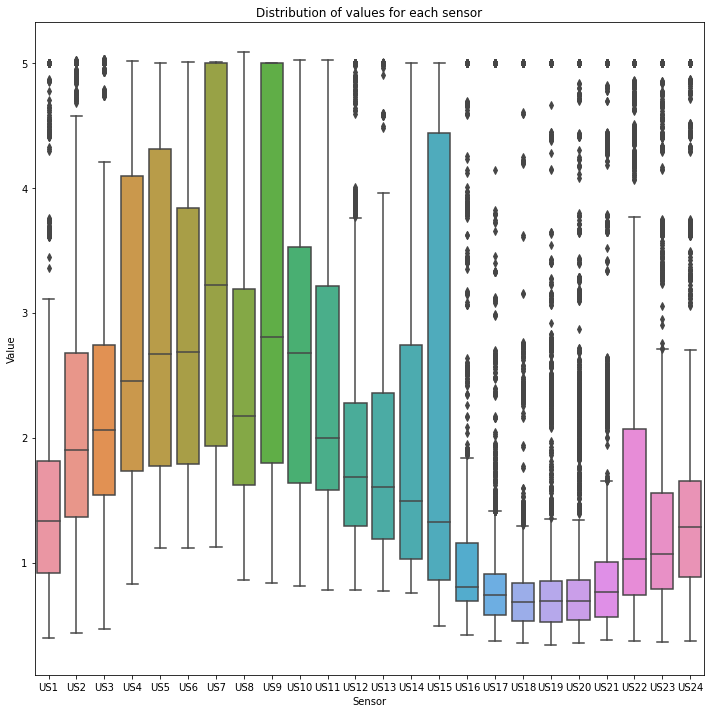

In [10]:
plt.figure(figsize=(12,12))
sns.boxplot(data=data_sensor)
plt.xlabel('Sensor')
plt.ylabel('Value')
plt.title('Distribution of values for each sensor')
plt.show()

* Range between 0 to 5 for all features. 

* The values of the left side of Toto (US14 to US24) are significaly lower than right side (US2 to US13)

## Classes

In [11]:
data_sensor['Class'].value_counts()

Move-Forward         2205
Sharp-Right-Turn     2097
Slight-Right-Turn     826
Slight-Left-Turn      328
Name: Class, dtype: int64

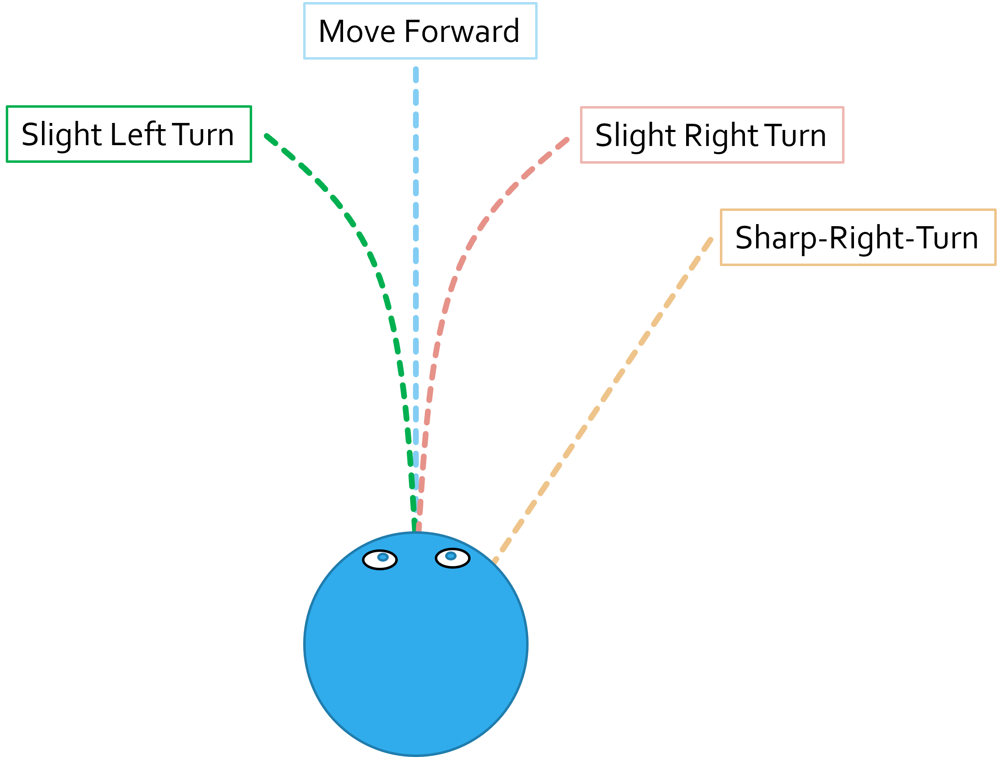

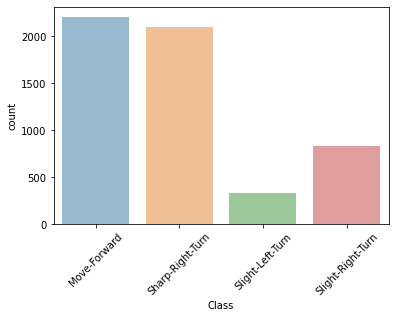

In [12]:
sns.countplot(data=data_sensor,x='Class',alpha=0.5)
plt.xticks(rotation=45)
plt.show()

Distribution of classes umbalanced : need to see if an oversample is needed.

## Visual analyze

Let see if I can see visualy some classification

In [13]:
import plotly.express as px
data_radar=data_sensor.melt(id_vars=['Class'], value_vars=names_columns[:-1],var_name='US', value_name='distance')
fig = px.scatter_polar(data_radar, r="distance", theta="US", color="Class", symbol="Class",
            color_discrete_sequence=px.colors.sequential.Jet)
fig.show()

Analyze :

* Left side : extremum less dense 
* No distinct visual classification

In [14]:
# sns.pairplot(data_sensor)
# plt.show()

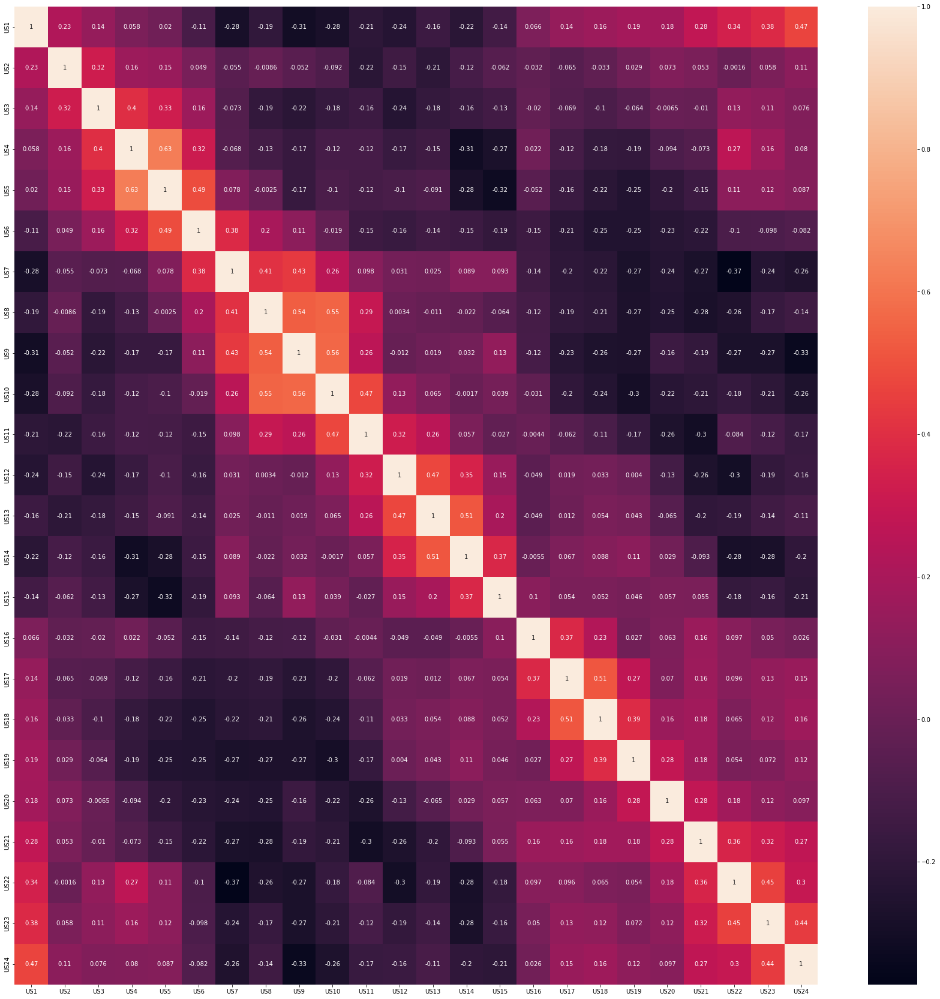

In [15]:
plt.figure(figsize=(30,30))
sns.heatmap(data_sensor.corr(),annot=True)

plt.show()

Correlation between sensors and their closed neighbors

# Modelling

## Type 

Supervised Classification (multi-class)

## Estimators

For this analyze, I'll use 5 different estimators :
* LogisticRegression
* Support Vector Machine (Classification)
* Naive Bayes
* K Nearest Neighbor
* Random Forest (Classification)

In [16]:
models = [
    LogisticRegression(max_iter=1000),
    svm.SVC(),
    GaussianNB(),
    KNeighborsClassifier(),
    RandomForestClassifier(random_state=123)
]
name_models=[str(i).split(f"(")[0] for i in models]

df_acc=pd.DataFrame(columns=name_models)

## Define Target/Features

In [17]:
# Definition of the features
X = data_sensor.iloc[:,:24]
X_col=X.columns
#Definition of the Target
Y = data_sensor['Class']

## Balance the dataset (if needed)

In [18]:
def Balance_data(X,y,balance=False):
    
    if balance:
        # Oversample with SMOTE and random undersample for imbalanced dataset
        from collections import Counter
        from imblearn.over_sampling import SMOTE
        from imblearn.under_sampling import RandomUnderSampler
        from imblearn.pipeline import Pipeline

        # summarize class distribution
        counter = Counter(Y)
        print(counter)
        # define pipeline
        over = SMOTE()
        under = RandomUnderSampler()
        steps = [('o', over), ('u', under)]
        pipeline = Pipeline(steps=steps)
        # transform the dataset
        X_bal, y_bal = pipeline.fit_resample(X, Y)
        # summarize the new class distribution
        counter = Counter(y_bal)
        print(counter)
        return X_bal, y_bal
    else:
        return X,y 
    
    return X_bal, y_bal
        
X,Y=Balance_data(X,Y,False)

## Split the data

In [19]:
# Split the datasets into training set and test set 
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.25, random_state=42)

# Name of the 4 classes
classes='Move-Forward Sharp-Right-Turn Slight-Right-Turn Slight-Left-Turn'.split()

## Standardize

In [20]:
def Standardize(X_train,X_test,standardize=False):
    
    if standardize :
        #Standard scaler
        scal=StandardScaler()
        X_train=scal.fit_transform(X_train)
        X_test=scal.transform(X_test)

        X_train=pd.DataFrame(X_train,columns=X_col)
        X_test=pd.DataFrame(X_test,columns=X_col)
    
    return X_train,X_test
    
X_train,X_test=Standardize(X_train,X_test,standardize=True)

## Features Engineering

### Forward selection (Classification)

In [21]:
def forward_selection(X_train,y_train,model,threshold=0.0005,show_steps=False):
    ## Use Forward Feature Selection to pick a good model

    # start with no predictors
    included = []
    acc_list=[]
    # keep track of model and parameters
    best = {'feature': '', 'acc': 0}

    n = X_train.shape[0]

    while True:

        changed = False

        if show_steps:
            print('')

        # list the features to be evaluated
        excluded = list(set(X.columns) - set(included))

        if show_steps:
            print('(Step) Excluded = %s' % ', '.join(excluded))

        # for each remaining feature to be evaluated
        for new_column in excluded:

            if show_steps:
                print('(Step) Trying %s...' % new_column)
                print('(Step) - Features = %s' %
                      ', '.join(included + [new_column]))

#             print(included + [new_column])
            # fit the model with the Training data
            model = model.fit(X_train[included + [new_column]], y_train)  # fit a model; consider which predictors should be included
            # calculate the score (Accuracy for classification)
            acc = model.score(X_train[included + [new_column]],y_train)  # calculate the score

            if show_steps:
                print('(Step) - Accuracy: This = %.3f; Best = %.3f' %
                      (acc, best['acc']))

            # if model improves
            if acc - best['acc']> threshold :
                # record new parameters
                best = {'feature': new_column, 'acc': acc}
                # flag that found a better model
                changed = True
                if show_steps:
                    print('(Step) - New Best!   : Feature = %s; acc = %.3f' % (best['feature'], best['acc']))
        # END for
        acc_list.append(best['acc'])

        # if found a better model after testing all remaining features
        if changed:
            # update control details
            included.append(best['feature'])
            excluded = list(set(excluded) - set(best['feature']))
#             print('Added feature %-4s with acc = %.3f' % (best['feature'], best['acc']))
        else:
            # terminate if no better model
            break

#     print('')
#     print('Resulting features:')
#     print(', '.join(included))

    return included, acc_list

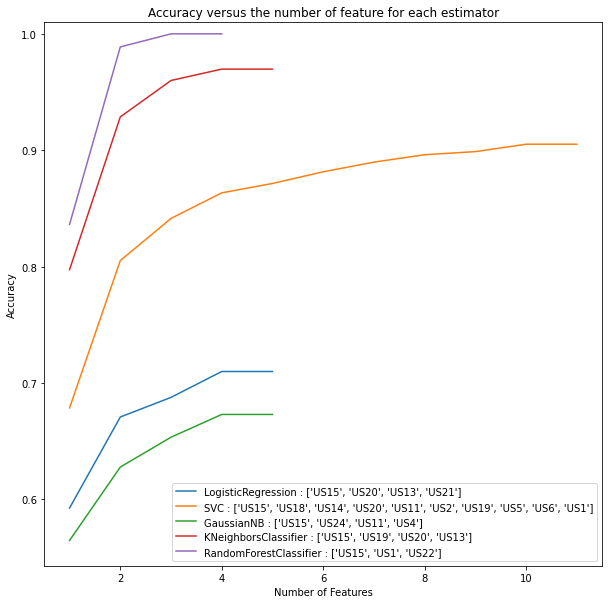

CPU times: total: 3min 40s
Wall time: 3min 37s


In [22]:
%%time
# Chart accuracy

# define chart size
plt.figure(figsize=(10, 10))
# plot each metric
model_feature={}
models=[LogisticRegression(max_iter=1000),svm.SVC(),GaussianNB(),KNeighborsClassifier(),RandomForestClassifier(random_state=123)]
for model in models:
    features_forward, acc_list = forward_selection(X_train, y_train, model)
    model_feature[str(model).split(f"(")[0]]=features_forward
    plt.plot(range(1, len(acc_list) + 1), acc_list, label=f'{str(model).split(f"(")[0]} : {features_forward}')

# add some better visualisation
plt.xlabel('Number of Features')
plt.ylabel('Accuracy')
plt.title('Accuracy versus the number of feature for each estimator')
plt.ylim(top=1.01)
plt.legend()
# output the chart
plt.show()

- List the most important features for each estimator 
- Give me an overview of the accuracy of the training model (no cross validation for this part)

## Verify and Evaluate the Training Model

In [23]:
def model_evaluation(model,classes,X_train,y_train,X_test,y_test,eval_testset=False):
    
    model.fit(X_train,y_train)
    
    if eval_testset:
        X=X_test
        y=y_test
        print(f'Accurancy test set {round(model.score(X_test, y_test),3)}')
    else: 
        X=X_train
        y=y_train
        
    y_pred_class = model.predict(X)
    cm=confusion_matrix(y, y_pred_class,labels=classes)    
    
    disp =ConfusionMatrixDisplay(cm,display_labels=classes)
    disp.plot()
    plt.title(f'Confusion matrix for {str(model).split("(")[0]}')
    plt.xticks(rotation=45)
    plt.show()
    
    print(classification_report(y, y_pred_class))
    acc=cross_val_score(model, X_train, y_train, cv=5, scoring='accuracy')

    return acc.mean()

### All features

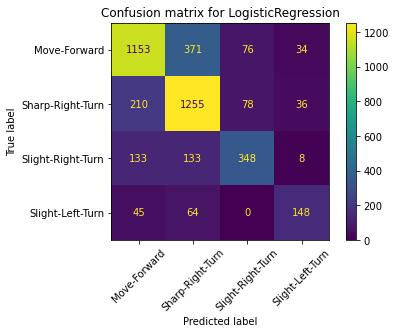

                   precision    recall  f1-score   support

     Move-Forward       0.75      0.71      0.73      1634
 Sharp-Right-Turn       0.69      0.79      0.74      1579
 Slight-Left-Turn       0.65      0.58      0.61       257
Slight-Right-Turn       0.69      0.56      0.62       622

         accuracy                           0.71      4092
        macro avg       0.70      0.66      0.67      4092
     weighted avg       0.71      0.71      0.71      4092



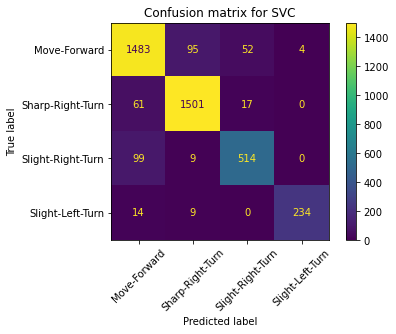

                   precision    recall  f1-score   support

     Move-Forward       0.89      0.91      0.90      1634
 Sharp-Right-Turn       0.93      0.95      0.94      1579
 Slight-Left-Turn       0.98      0.91      0.95       257
Slight-Right-Turn       0.88      0.83      0.85       622

         accuracy                           0.91      4092
        macro avg       0.92      0.90      0.91      4092
     weighted avg       0.91      0.91      0.91      4092



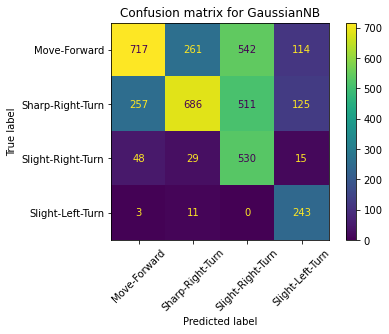

                   precision    recall  f1-score   support

     Move-Forward       0.70      0.44      0.54      1634
 Sharp-Right-Turn       0.70      0.43      0.53      1579
 Slight-Left-Turn       0.49      0.95      0.64       257
Slight-Right-Turn       0.33      0.85      0.48       622

         accuracy                           0.53      4092
        macro avg       0.55      0.67      0.55      4092
     weighted avg       0.63      0.53      0.54      4092



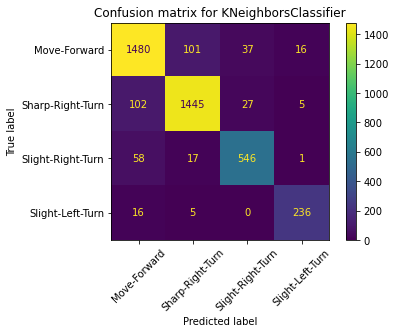

                   precision    recall  f1-score   support

     Move-Forward       0.89      0.91      0.90      1634
 Sharp-Right-Turn       0.92      0.92      0.92      1579
 Slight-Left-Turn       0.91      0.92      0.92       257
Slight-Right-Turn       0.90      0.88      0.89       622

         accuracy                           0.91      4092
        macro avg       0.91      0.90      0.91      4092
     weighted avg       0.91      0.91      0.91      4092



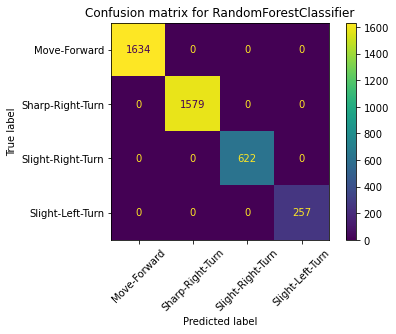

                   precision    recall  f1-score   support

     Move-Forward       1.00      1.00      1.00      1634
 Sharp-Right-Turn       1.00      1.00      1.00      1579
 Slight-Left-Turn       1.00      1.00      1.00       257
Slight-Right-Turn       1.00      1.00      1.00       622

         accuracy                           1.00      4092
        macro avg       1.00      1.00      1.00      4092
     weighted avg       1.00      1.00      1.00      4092

CPU times: total: 15.2 s
Wall time: 6.43 s


In [24]:
%%time
acc_model_full=[]
for model in models:
    name_model=str(model).split(f"(")[0]
    acc=model_evaluation(model,classes,X_train,y_train,X_test,y_test,eval_testset=False)
    acc_model_full.append(round(acc,2))
    
df_acc.loc['All_features'] = acc_model_full

### Forward selected features

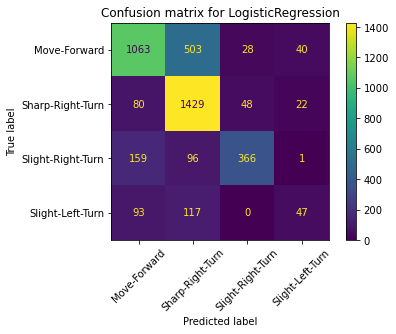

                   precision    recall  f1-score   support

     Move-Forward       0.76      0.65      0.70      1634
 Sharp-Right-Turn       0.67      0.91      0.77      1579
 Slight-Left-Turn       0.43      0.18      0.26       257
Slight-Right-Turn       0.83      0.59      0.69       622

         accuracy                           0.71      4092
        macro avg       0.67      0.58      0.60      4092
     weighted avg       0.71      0.71      0.70      4092



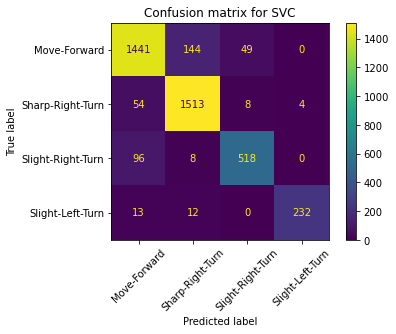

                   precision    recall  f1-score   support

     Move-Forward       0.90      0.88      0.89      1634
 Sharp-Right-Turn       0.90      0.96      0.93      1579
 Slight-Left-Turn       0.98      0.90      0.94       257
Slight-Right-Turn       0.90      0.83      0.87       622

         accuracy                           0.91      4092
        macro avg       0.92      0.89      0.91      4092
     weighted avg       0.91      0.91      0.90      4092



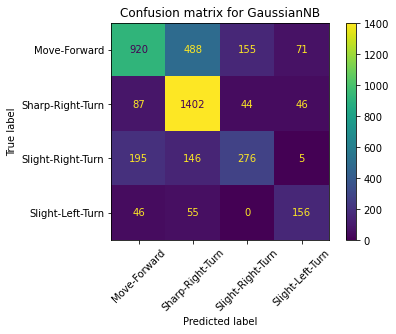

                   precision    recall  f1-score   support

     Move-Forward       0.74      0.56      0.64      1634
 Sharp-Right-Turn       0.67      0.89      0.76      1579
 Slight-Left-Turn       0.56      0.61      0.58       257
Slight-Right-Turn       0.58      0.44      0.50       622

         accuracy                           0.67      4092
        macro avg       0.64      0.63      0.62      4092
     weighted avg       0.68      0.67      0.66      4092



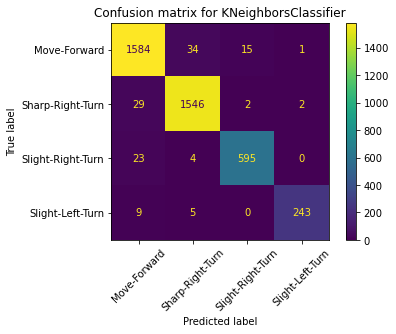

                   precision    recall  f1-score   support

     Move-Forward       0.96      0.97      0.97      1634
 Sharp-Right-Turn       0.97      0.98      0.98      1579
 Slight-Left-Turn       0.99      0.95      0.97       257
Slight-Right-Turn       0.97      0.96      0.96       622

         accuracy                           0.97      4092
        macro avg       0.97      0.96      0.97      4092
     weighted avg       0.97      0.97      0.97      4092



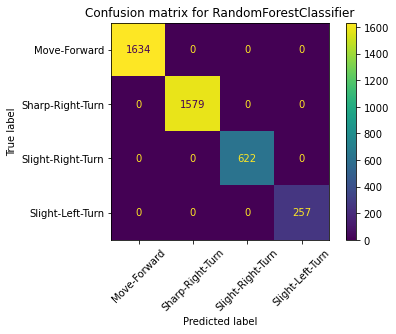

                   precision    recall  f1-score   support

     Move-Forward       1.00      1.00      1.00      1634
 Sharp-Right-Turn       1.00      1.00      1.00      1579
 Slight-Left-Turn       1.00      1.00      1.00       257
Slight-Right-Turn       1.00      1.00      1.00       622

         accuracy                           1.00      4092
        macro avg       1.00      1.00      1.00      4092
     weighted avg       1.00      1.00      1.00      4092

CPU times: total: 4.58 s
Wall time: 4.57 s


In [25]:
%%time
acc_model_feature=[]
for model in models:
    name_model=str(model).split(f"(")[0]
    acc=model_evaluation(model,classes,X_train[model_feature[name_model]],y_train,X_test[model_feature[name_model]],y_test,eval_testset=False)
    acc_model_feature.append(round(acc,2))
df_acc.loc['best_features_selected'] = acc_model_feature

In [26]:
df_acc

,LogisticRegression,SVC,GaussianNB,KNeighborsClassifier,RandomForestClassifier
All_features,0.70,0.88,0.53,0.85,0.99
best_features_selected,0.71,0.88,0.67,0.95,0.91


Observation :
* This dataset in not linearly separable (accuracy <1 for logistic regression)
* LogisticRegression: Accuracy stable between all the features and only 4 features ['US15', 'US20', 'US13', 'US21']
* Support vector machine is the longest to compute. Its accuracy is better than LogisticRegression and stable between all the features and 10 features ['US15',  'US18',  'US14',  'US20',  'US11',  'US2',  'US19',  'US5',  'US6',  'US1']
* Naive Bayes is the worst model. Good improvement with the selected but finished with only an accuracy of 0.67.
* KNeighborsClassifier has improved a lot with the selected features. Reasons : less irrelevant features
* RandomForest is the best model. Its accurancy has dropped with the selected features. It can be explain by during the forward feature selection, the model overfited (no cross validation and lack of no correlation). It would be better to avoid forward feature selection for RandomForest and do instead backward feature selection.


* I will keep the top 3 models for tuning (SVC, KNeighborsClassifier, RandomForestClassifier)

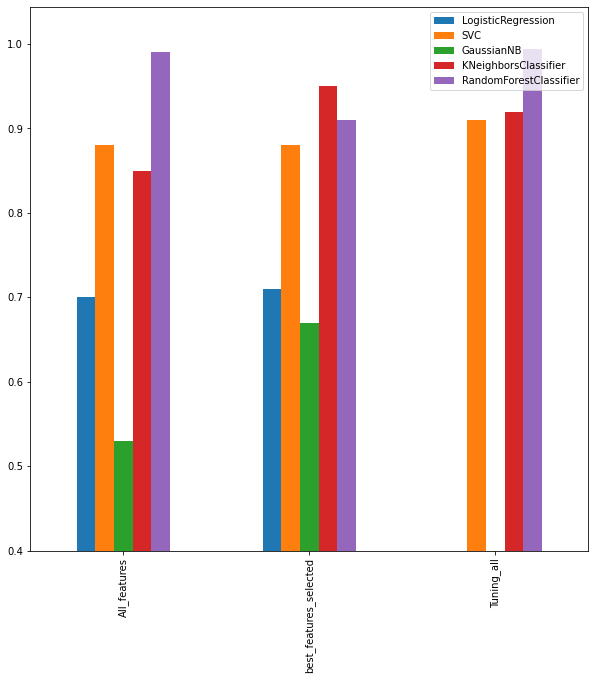

In [51]:
df_acc.plot(kind='bar',figsize=(10, 10))
plt.ylim(bottom=0.4)
plt.show()

## Tuning

### All features

In [27]:
svc_params = {
    'C': [0.1, 10, 100],
    'gamma': [0.001,0.005, 0.0001],
    'kernel': ['linear','rbf']
}

clf=svm.SVC()
grid_search_svc = GridSearchCV(estimator=clf, param_grid=svc_params, scoring='accuracy',cv=5)
grid_search_svc.fit(X_train, y_train)
print('Best estimator:', grid_search_svc.best_estimator_)
print('Best params:', grid_search_svc.best_params_)
print('Best accuracy:', grid_search_svc.best_score_)

Best estimator: SVC(C=100, gamma=0.005)
Best params: {'C': 100, 'gamma': 0.005, 'kernel': 'rbf'}
Best accuracy: 0.9071328562771106


In [28]:
knn = KNeighborsClassifier()

parameters_KNN = {
    'n_neighbors': (3, 5, 7, 9),
    'p': (1, 2),
    'weights': ('uniform', 'distance')
}

# defining parameter range
grid_search_knn = GridSearchCV(knn,
                               param_grid=parameters_KNN,
                               cv=5,
                               scoring='accuracy')

grid_search_knn.fit(X_train, y_train)
print('Best estimator:', grid_search_knn.best_estimator_)
print('Best params:', grid_search_knn.best_params_)
print('Best accuracy:', grid_search_knn.best_score_)

Best estimator: KNeighborsClassifier(p=1, weights='distance')
Best params: {'n_neighbors': 5, 'p': 1, 'weights': 'distance'}
Best accuracy: 0.9198420161745344


In [29]:
%%time
# Number of trees in random forest
n_estimators = [50,100,200,500]

# Create the random grid
random_grid = {
    'n_estimators': n_estimators
}

grid_search_rdfor = GridSearchCV(RandomForestClassifier(random_state=123),
                                 random_grid,
                                 cv=5,
                                 scoring='accuracy')
grid_search_rdfor.fit(X_train, y_train)
print('Best estimator:', grid_search_rdfor.best_estimator_)
print('Best params:', grid_search_rdfor.best_params_)
print('Best accuracy:', grid_search_rdfor.best_score_)

Best estimator: RandomForestClassifier(random_state=123)
Best params: {'n_estimators': 100}
Best accuracy: 0.9938899188287941
CPU times: total: 18.6 s
Wall time: 17.5 s


# Verify the Test Model

Accurancy test set 0.895


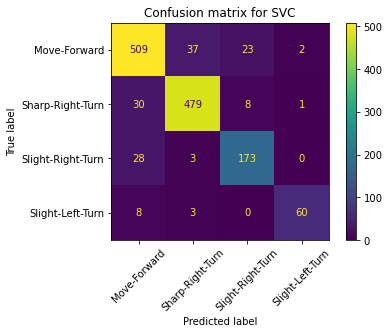

                   precision    recall  f1-score   support

     Move-Forward       0.89      0.89      0.89       571
 Sharp-Right-Turn       0.92      0.92      0.92       518
 Slight-Left-Turn       0.95      0.85      0.90        71
Slight-Right-Turn       0.85      0.85      0.85       204

         accuracy                           0.90      1364
        macro avg       0.90      0.88      0.89      1364
     weighted avg       0.90      0.90      0.90      1364

CPU times: total: 1.98 s
Wall time: 1.98 s


In [30]:
%%time
model=grid_search_svc.best_estimator_
model_evaluation(model,classes,X_train,y_train,X_test,y_test,eval_testset=True)
df_acc.loc['Tuning_all',str(model).split("(")[0]] = round(grid_search_svc.best_score_,2)

Accurancy test set 0.908


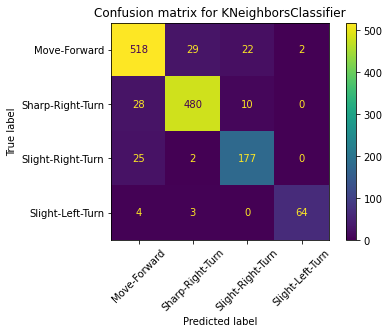

                   precision    recall  f1-score   support

     Move-Forward       0.90      0.91      0.90       571
 Sharp-Right-Turn       0.93      0.93      0.93       518
 Slight-Left-Turn       0.97      0.90      0.93        71
Slight-Right-Turn       0.85      0.87      0.86       204

         accuracy                           0.91      1364
        macro avg       0.91      0.90      0.91      1364
     weighted avg       0.91      0.91      0.91      1364

CPU times: total: 609 ms
Wall time: 607 ms


In [31]:
%%time
model=grid_search_knn.best_estimator_
model_evaluation(model,classes,X_train,y_train,X_test,y_test,eval_testset=True)
df_acc.loc['Tuning_all',str(model).split("(")[0]] = round(grid_search_knn.best_score_,2)

Accurancy test set 0.99


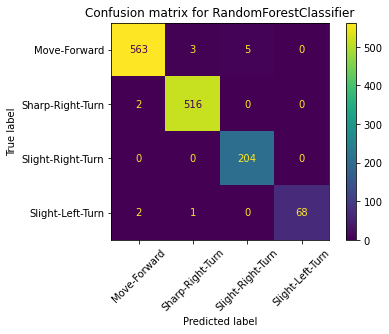

                   precision    recall  f1-score   support

     Move-Forward       0.99      0.99      0.99       571
 Sharp-Right-Turn       0.99      1.00      0.99       518
 Slight-Left-Turn       1.00      0.96      0.98        71
Slight-Right-Turn       0.98      1.00      0.99       204

         accuracy                           0.99      1364
        macro avg       0.99      0.98      0.99      1364
     weighted avg       0.99      0.99      0.99      1364

CPU times: total: 2.67 s
Wall time: 2.68 s


In [53]:
%%time
model=grid_search_rdfor.best_estimator_
model_evaluation(model,classes,X_train,y_train,X_test,y_test,eval_testset=True)
df_acc.loc['Tuning_all',str(model).split("(")[0]] = round(grid_search_rdfor.best_score_,2)

In [54]:
df_acc

,LogisticRegression,SVC,GaussianNB,KNeighborsClassifier,RandomForestClassifier
All_features,0.70,0.88,0.53,0.85,0.99
best_features_selected,0.71,0.88,0.67,0.95,0.91
Tuning_all,NaN,0.91,NaN,0.92,0.99


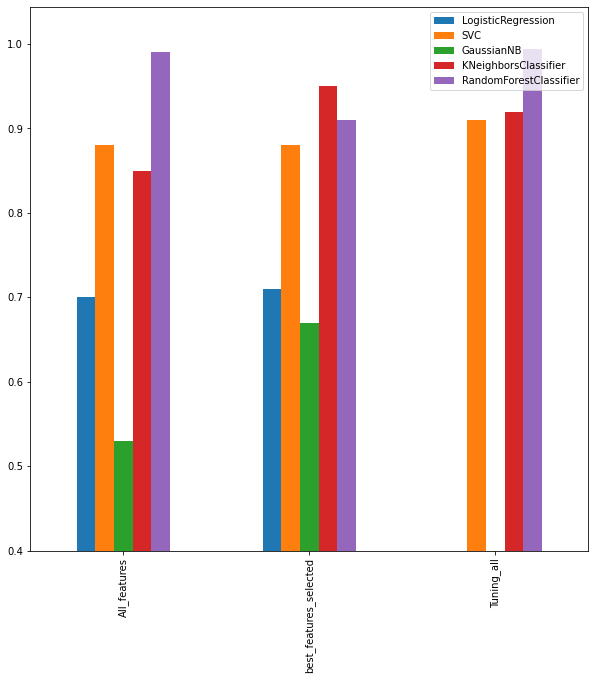

In [48]:
df_acc.plot(kind='bar',figsize=(10, 10),)
plt.ylim(bottom=0.4)
plt.show()

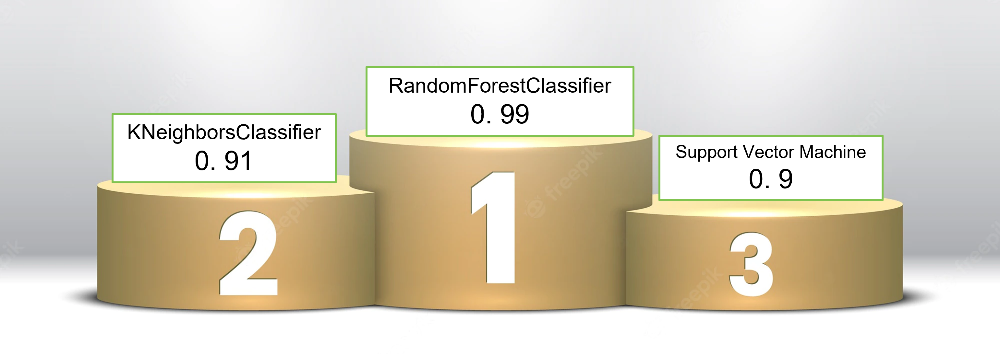

# Conclusion

* RandomForestClassifier is the best model to predict with a accuracy of 99%

* Even the data set was unbalance, the model do good job to predict to turn slight left (no need to oversample)

* The mission is a success

Possible improvement :
- Deeper feature engineering for RandomForestClassifier
- Tuning with selected features